# 1st Kr NEXT-100 data look

## Run 15502

In [5]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2

## Configuration

In [6]:
import re
import glob
from collections import namedtuple

import sys
pypaths= ("/Users/hernando/work/investigacion/NEXT/software/nextana",
         "/Users/hernando/work/investigacion/NEXT/software/hipy",
         "/Users/hernando/work/investigacion/NEXT/software/IC")
for ipypath in pypaths:
       sys.path.insert(0,ipypath)

In [7]:
import numpy             as np
import pandas            as pd
import tables            as tb
from   scipy             import stats
from   scipy             import optimize

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d

plt.rcParams['image.cmap'] = 'rainbow'

In [8]:
from invisible_cities.io.dst_io import load_dst, load_dsts

In [9]:
import hipy.utils        as ut
import hipy.histos       as histos
import hipy.pltext       as pltext
import hipy.profile      as prof

import nana.kr.krana    as krana
import nana.kr.kr100ana as krn100
import nana.kr.krmap    as krtool

#import nana.bclouds.bclouds      as bc
#import hipy.hfit         as hfit
from invisible_cities.io.dst_io import load_dst, load_dsts
#import invisible_cities.io.dst_io as dio

In [10]:
pltext.style()

import warnings
warnings.filterwarnings('ignore')

import time
print(' Last revision ', time.asctime())

 Last revision  Mon Jul 28 17:12:20 2025


## Import Data

In [11]:
from os import listdir
path_data = '/Users/hernando/work/investigacion/NEXT/data/NEXT100/data/' 

def getfiles(run_number, 
            version = "v2.3.1/20250512",
            city = "sophronia",
            trigger = 'trigger1',
            ldc = 'ldc1'):
    path_run =  f'{run_number}/hdf5/prod/{version}/sophronia/trigger1/{ldc}/'
    filenames = listdir(path_data + path_run)
    filenames.sort()
    print('number of files :', len(filenames))
    print('fist files: ', filenames[0], filenames[-1])
    filenames = [path_data + path_run + '/' + ifile for ifile in filenames]
    return filenames

In [12]:
files = [getfiles(15502, ldc = 'ldc'+str(i+1))[0] for i in range(7)]

number of files : 1
fist files:  ldc1.h5 ldc1.h5
number of files : 1
fist files:  ldc2.h5 ldc2.h5
number of files : 1
fist files:  ldc3.h5 ldc3.h5
number of files : 1
fist files:  ldc4.h5 ldc4.h5
number of files : 1
fist files:  ldc5.h5 ldc5.h5
number of files : 1
fist files:  ldc6.h5 ldc6.h5
number of files : 1
fist files:  ldc7.h5 ldc7.h5


In [15]:
kdst = load_dsts(files, "DST", "Events")
#kdst = load_dst(filenames[0], "DST", "Events")

In [9]:
kdst.columns

Index(['event', 'time', 's1_peak', 's2_peak', 'nS1', 'nS2', 'S1w', 'S1h',
       'S1e', 'S1t', 'S2w', 'S2h', 'S2e', 'S2q', 'S2t', 'qmax', 'Nsipm', 'DT',
       'Z', 'Zrms', 'X', 'Y', 'R', 'Phi', 'Xrms', 'Yrms'],
      dtype='object')

## Prepare Data

In [16]:
kdst = krn100.df_extend(kdst)
#kdst = kdst.rename(columns = {'S2e' : 'energy', 'X' : 'x', 'Y' : 'y', 'Z' : 'dt', 'Zrms': 'dtrms',
#                              'DT' : 'dtime', 'R' : 'r'})

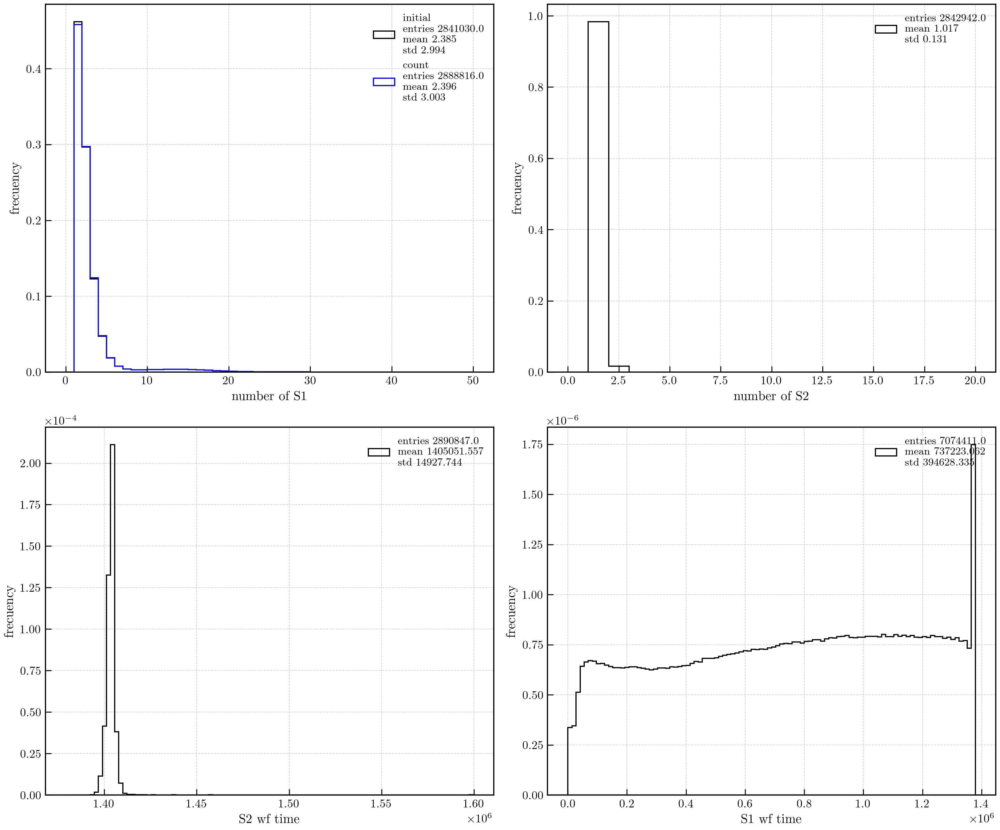

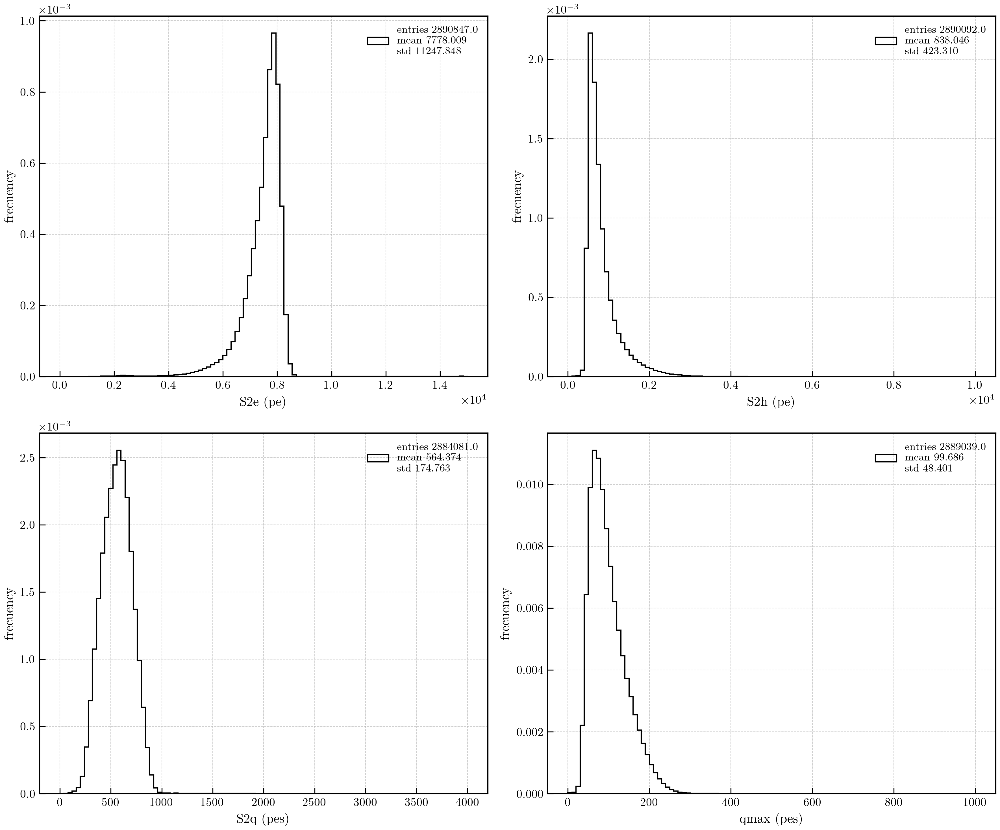

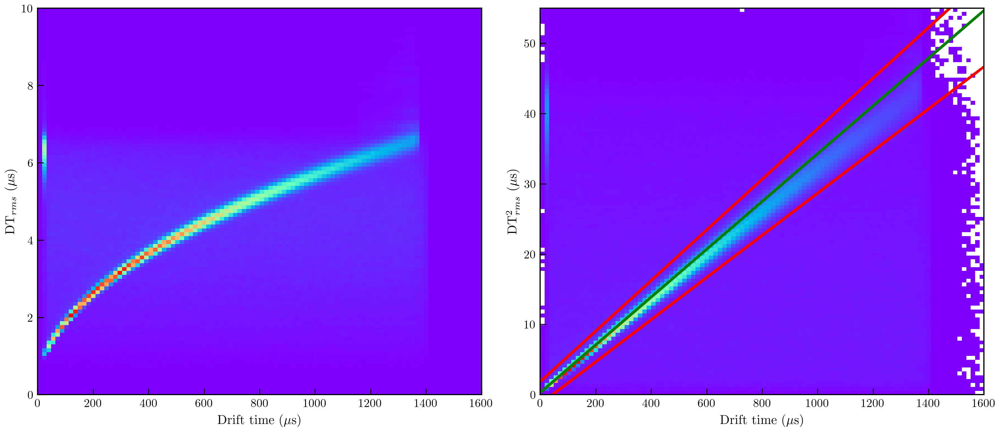

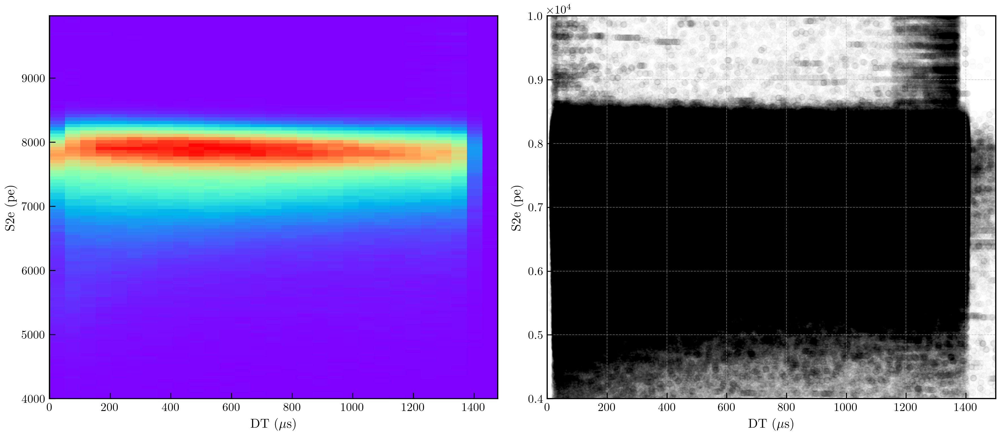

In [17]:
krn100.monitor_S1S2(kdst)
krn100.monitor_S2(kdst)
krn100.monitor_S2s_dtime(kdst)
krn100.monitor_lifetime(kdst)

## Standard selection

In [18]:
kdst_, effs    = krn100.kdst_select(kdst)

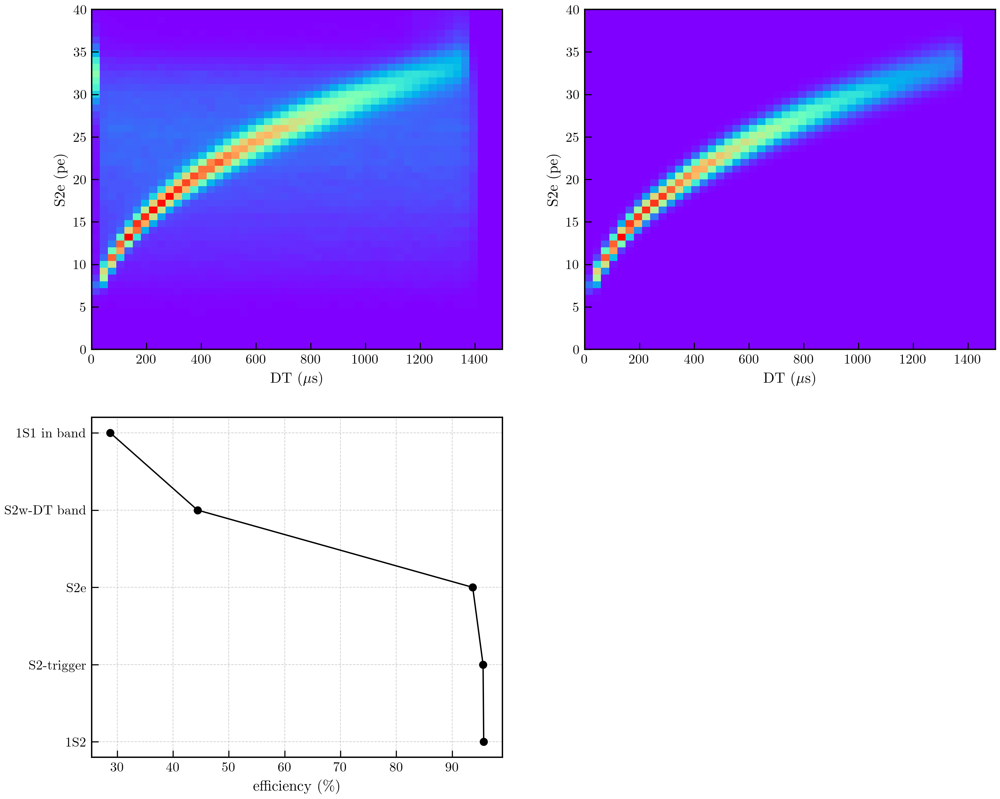

In [19]:
cv = pltext.canvas(4, 2)
cv(3);
names, vals = [x[0] for x in effs], [100.*x[1] for x in effs]
plt.plot(vals, names, marker = "o", color = 'black', lw =1); plt.xlabel("efficiency (\%)")
cv(1); plt.hist2d(kdst.DT, kdst.S2w, 50, ((0, 1500), (0, 40))); 
plt.xlabel(r'DT ($\mu$s)'), plt.ylabel('S2e (pe)');
cv(2); plt.hist2d(kdst_.DT, kdst_.S2w, 50, ((0, 1500), (0, 40))); 
plt.xlabel(r'DT ($\mu$s)'), plt.ylabel('S2e (pe)');

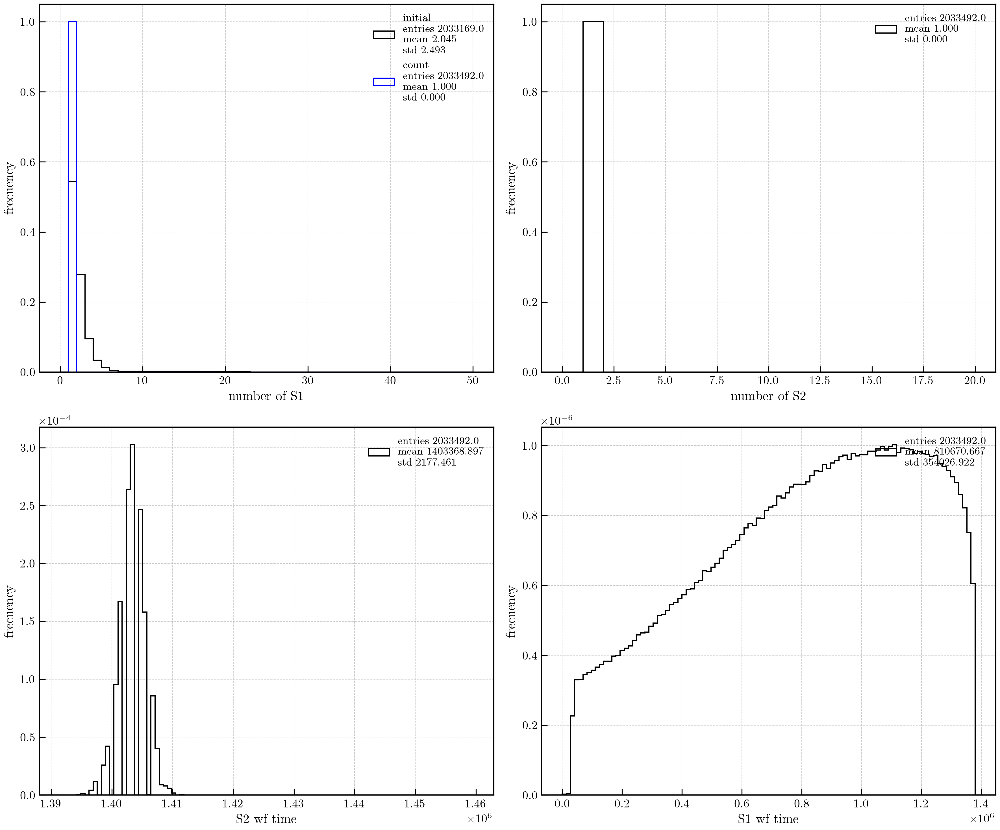

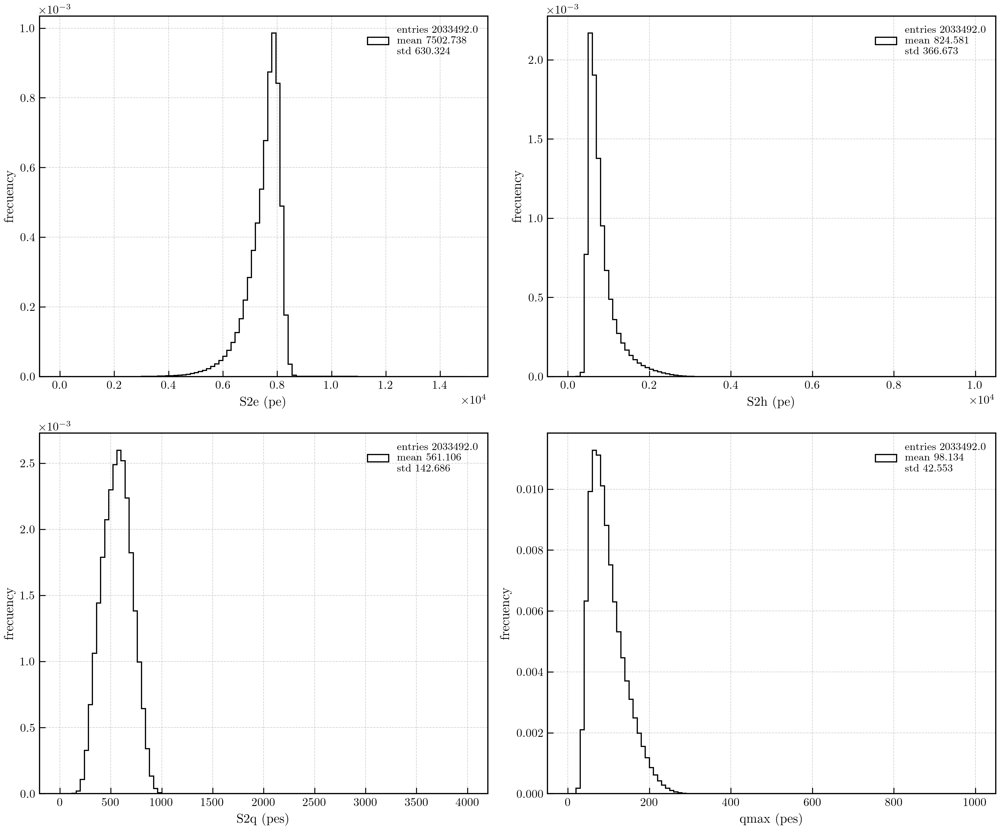

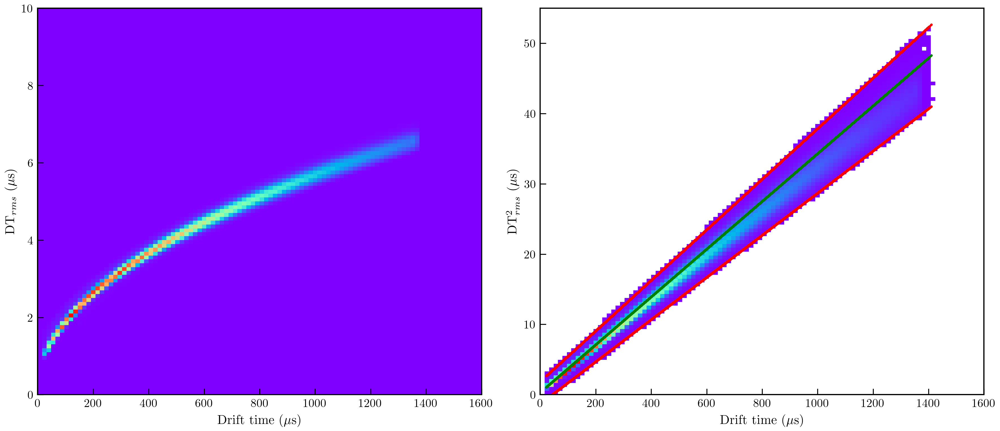

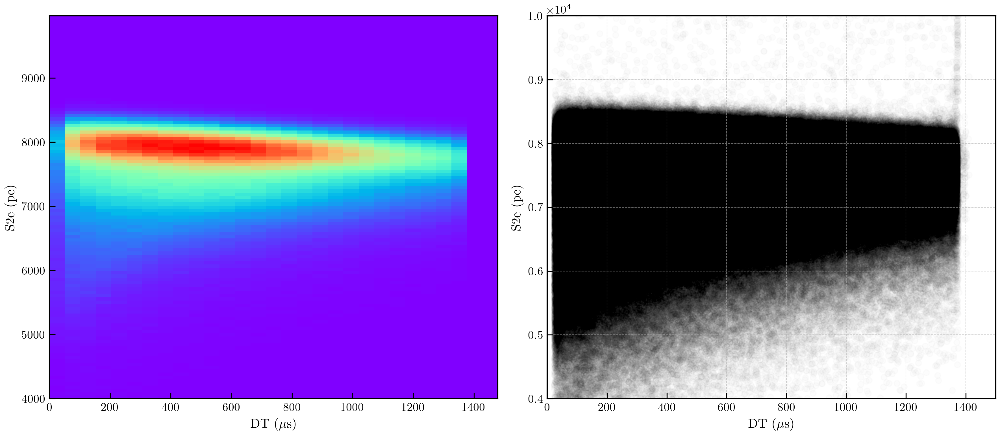

In [21]:
krn100.monitor_S1S2(kdst_)
krn100.monitor_S2(kdst_)
krn100.monitor_S2s_dtime(kdst_)
krn100.monitor_lifetime(kdst_)

## Fidutal selection

In [22]:
df = kdst_
sels = {}
sels['R']        = ut.in_range(df.R  , (0., 500.))
sels['DT']       = ut.in_range(df.DT , (0., 2000.))
sels['S2e']      = ut.in_range(df.S2e, (0e3, 9e3))
sels['fidutial'] = (sels['R']) & (sels['DT']) & (sels['S2e'])

## KrMap

In [23]:
counts_min = 40
pitch      = 15.00
xmin       = -489.825
xbins      = np.arange(xmin, -xmin + pitch, pitch)
bins       = (xbins, xbins) 
print('number of bins ', len(xbins), ', range : ', xbins[0], ', ', xbins[-1])

number of bins  67 , range :  -489.825 ,  500.175


In [26]:
def clean_krmap(coors, dtime, energy, min_sigma = 0.9, dt0 = None, plot = True):
    sel     = np.ones(len(energy), bool)
    clean   = np.copy(sel)
    done    = False
    while (not done):
        icoors  = [coor[clean] for coor in coors]
        idtime  = dtime[clean]
        iene    = energy[clean]
        krmap, residuals   = krtool.krmap(icoors, idtime, iene,
                                         bins = bins, counts_min = counts_min, dt0 = dt0)
        done, usel = krtool.accept_residuals(residuals, range = (-5.,5.), 
                                            fun = 'gaus', nsigma = 4., min_sigma = min_sigma, plot = plot)
        clean[clean == True] = usel
    return krmap, clean

In [27]:
#df     = kdst_
sel    = sels['fidutial']
coors  = df[sel].X, df[sel].Y
energy = df[sel].S2e
dtime  = df[sel].DT

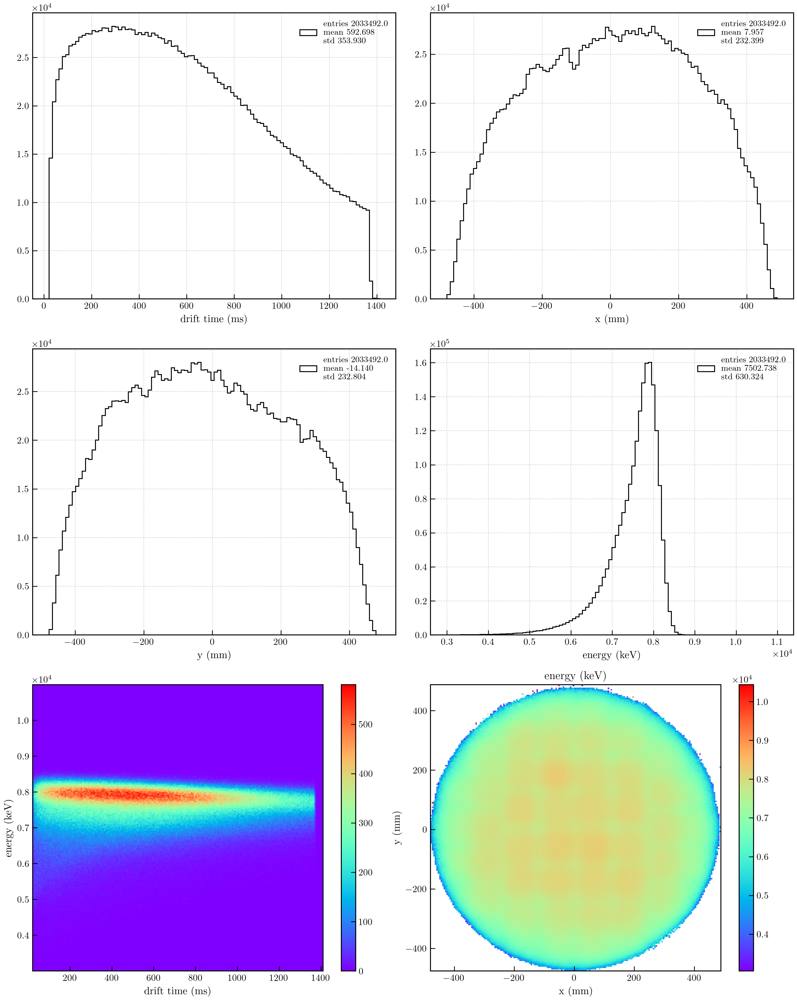

In [29]:
krana.plot_data(df.X, df.Y, df.DT, df.S2e, bins = 200)

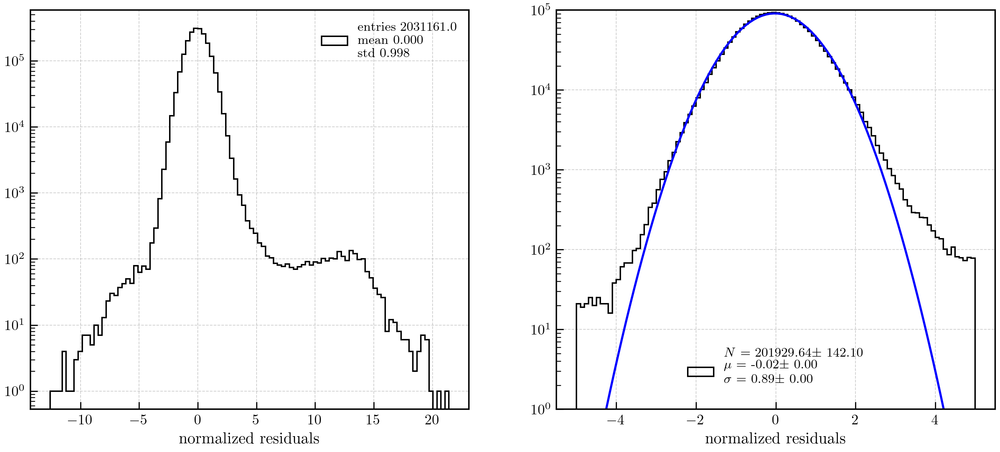

sigma 0.89 done  False  eff 99.63


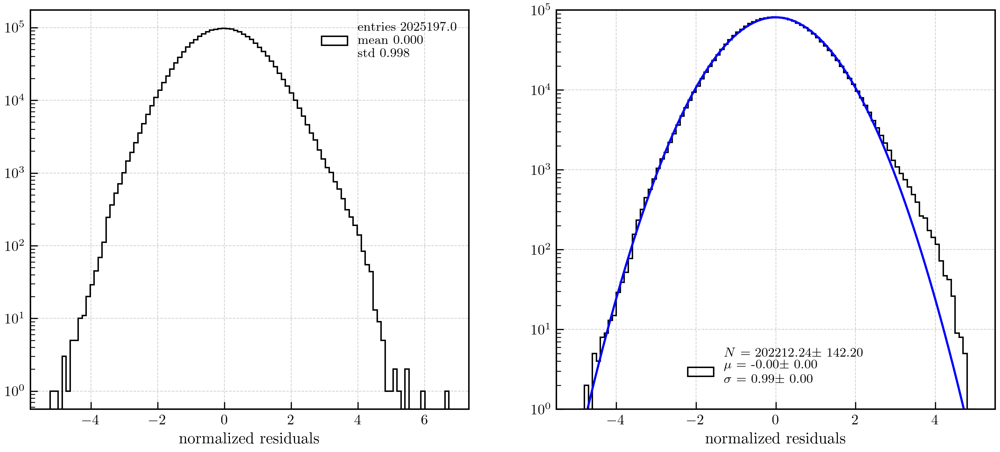

sigma 0.99 done  True  eff 100.00


In [30]:
min_sigma = 0.90
dt0       = 0 # compute the map in the EL
krmap, krsel = clean_krmap(coors, dtime, energy, min_sigma = min_sigma, dt0 = dt0)

In [31]:
def krmap_set_lifetime(krmap):
    dedt, udedt = krmap.dedt, krmap.udedt
    eref, ueref = krmap.eref, krmap.ueref
    lt  = eref/dedt
    ult = np.sqrt((ueref/dedt)**2 + (lt * udedt/dedt)**2)
    return lt, ult

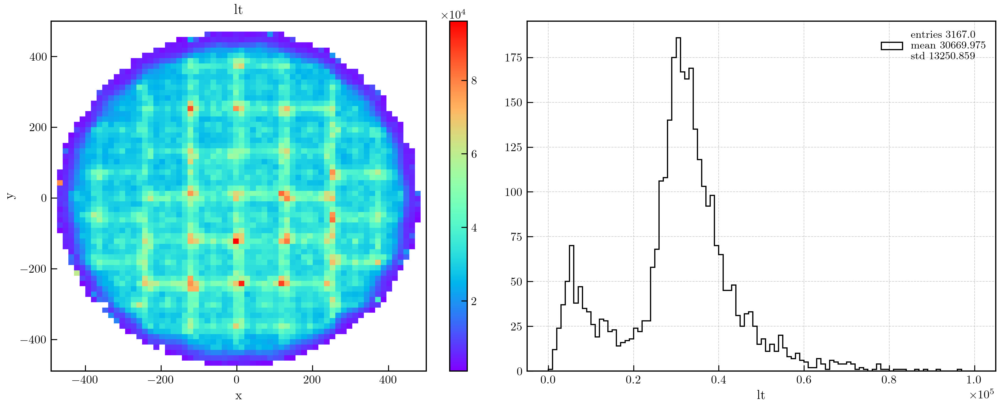

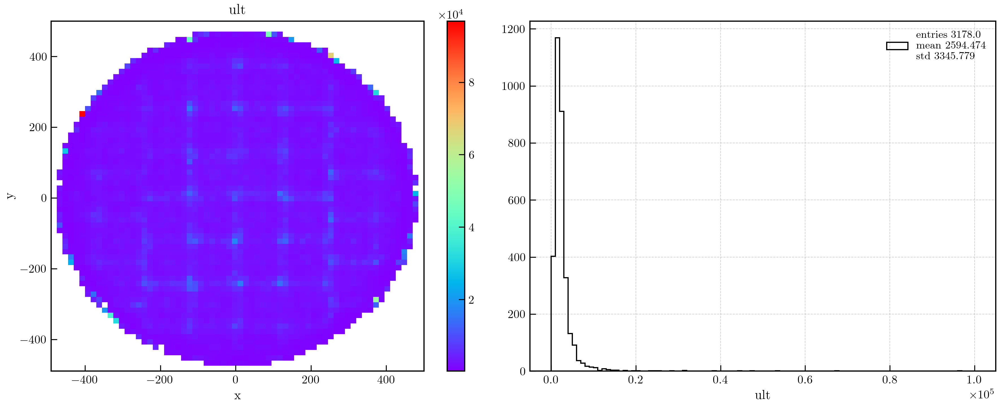

In [32]:
lt, ult = krmap_set_lifetime(krmap)
krtool.plot_xyvar(lt   , krmap.bin_edges, 'lt'  , mask = krmap.success, range = (0, 10e4));
krtool.plot_xyvar(ult  , krmap.bin_edges, 'ult' , mask = krmap.success, range = (0, 10e4))

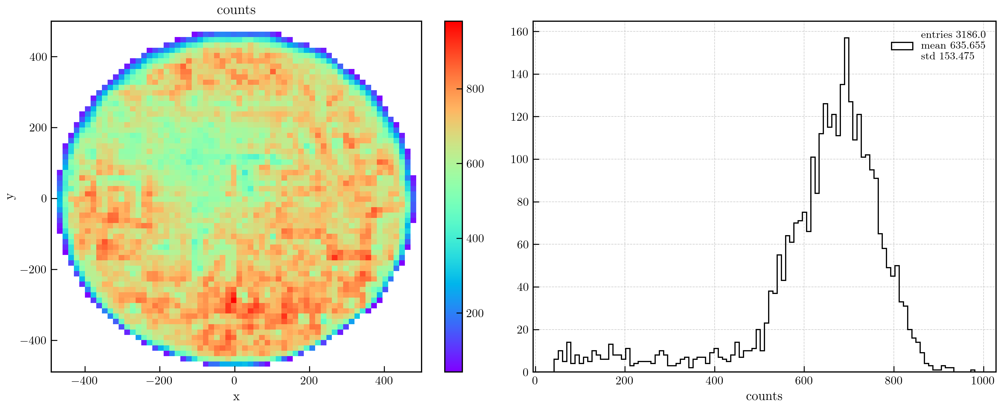

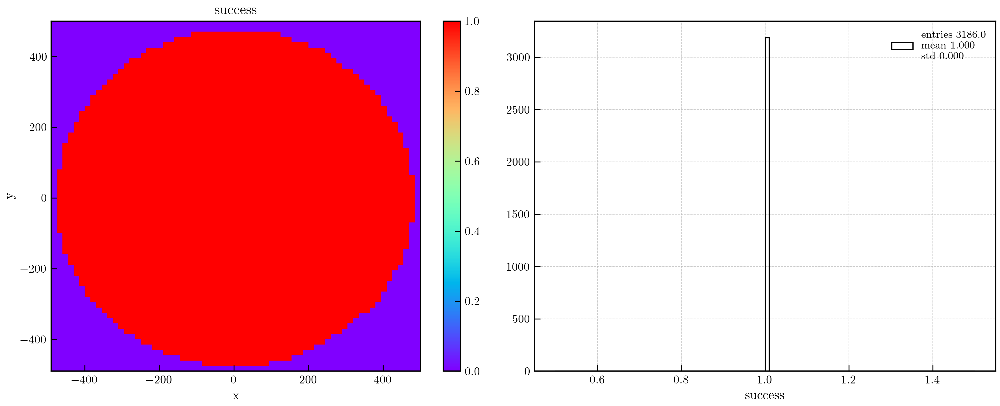

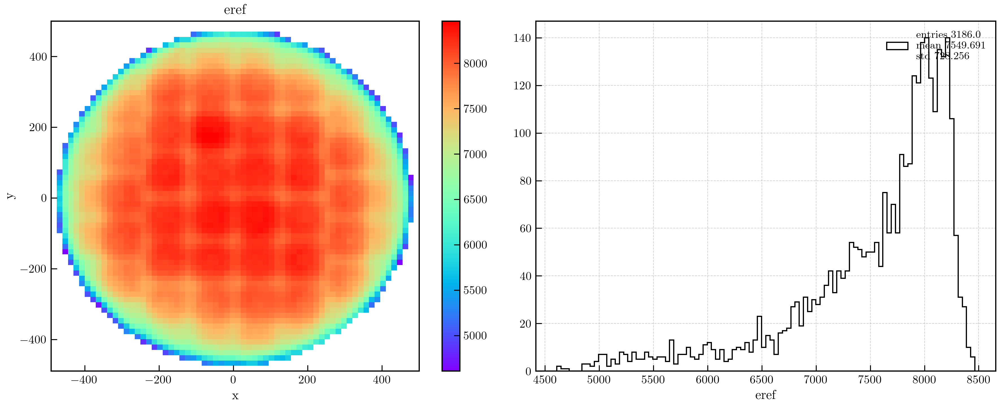

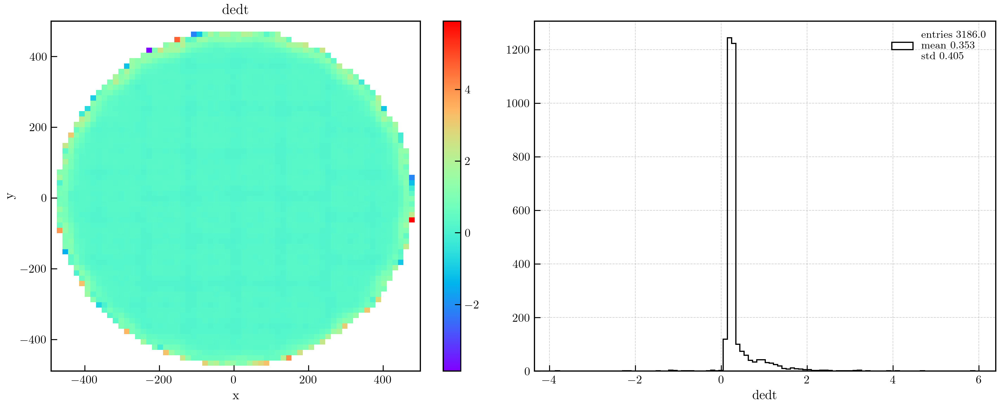

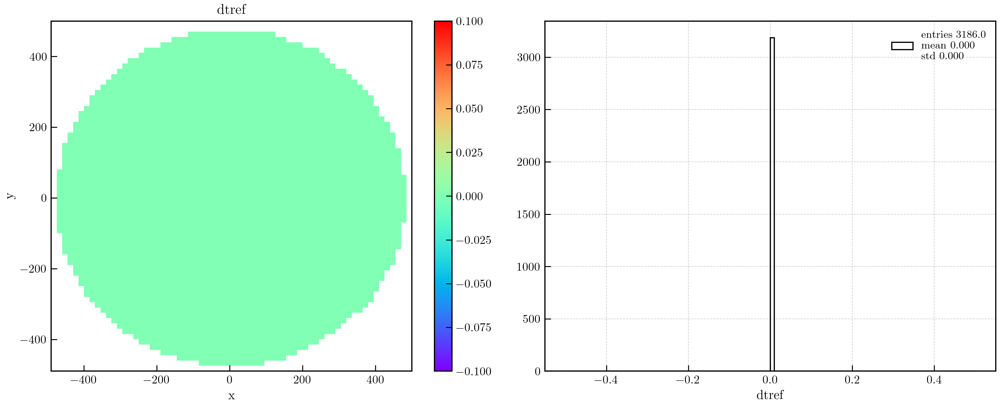

...

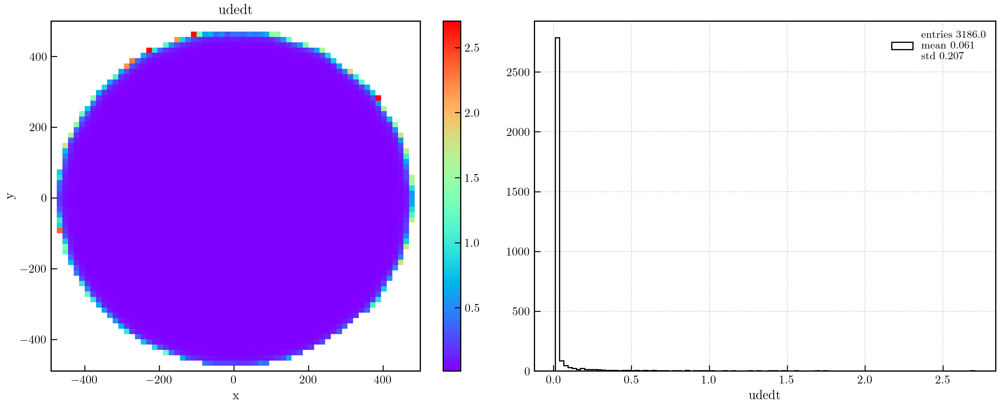

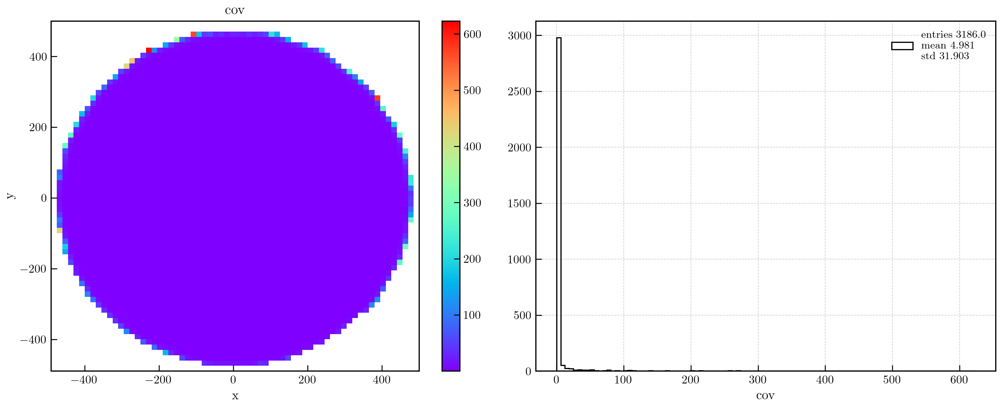

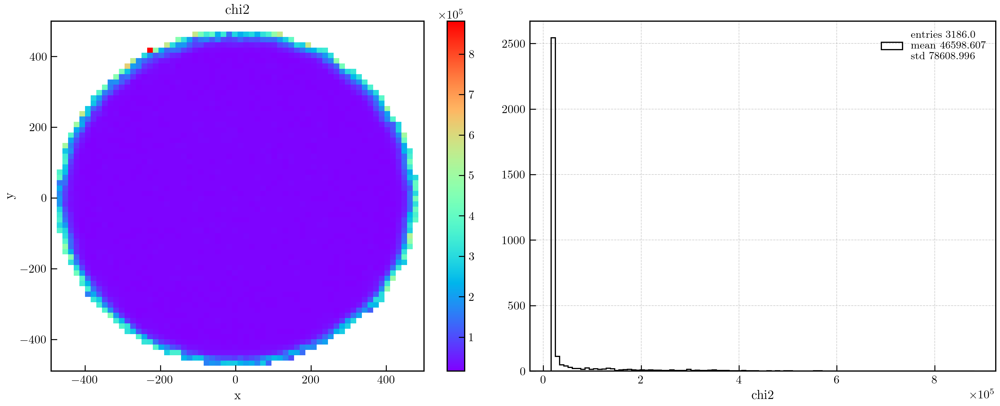

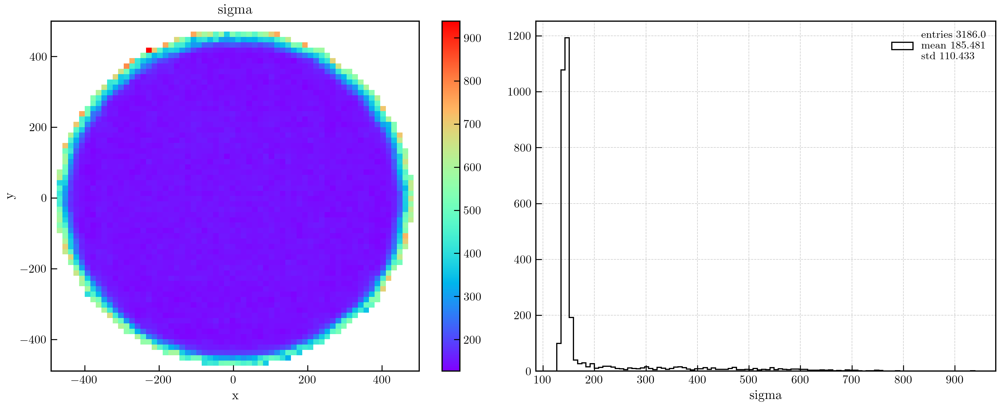

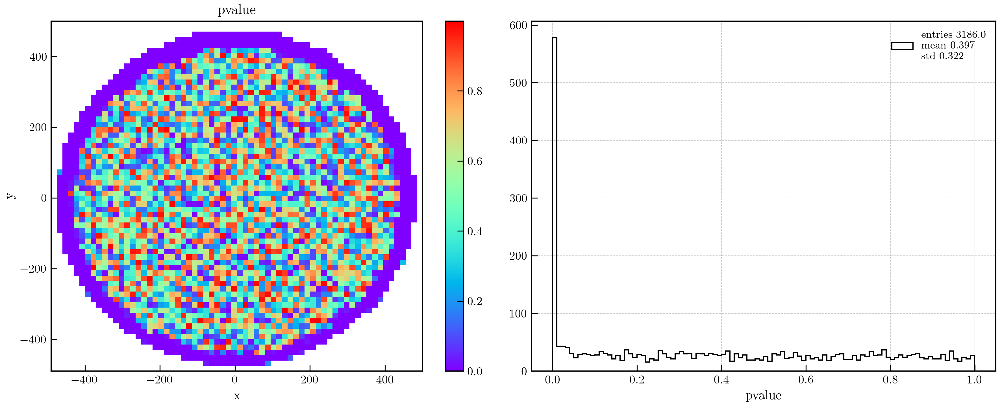

In [33]:
krtool.plot_xyvar(krmap.counts , krmap.bin_edges, 'counts' , mask = krmap.counts > 0)
krtool.plot_xyvar(krmap.success, krmap.bin_edges, 'success', mask = krmap.success)
krtool.plot_xyvar(krmap.eref   , krmap.bin_edges, 'eref'   , mask = krmap.success)
krtool.plot_xyvar(krmap.dedt   , krmap.bin_edges, 'dedt'   , mask = krmap.success)
krtool.plot_xyvar(krmap.dtref  , krmap.bin_edges, 'dtref'  , mask = krmap.success)
krtool.plot_xyvar(krmap.ueref  , krmap.bin_edges, 'ueref'  , mask = krmap.success)
krtool.plot_xyvar(krmap.udedt  , krmap.bin_edges, 'udedt'  , mask = krmap.success)
krtool.plot_xyvar(krmap.cov    , krmap.bin_edges, 'cov'    , mask = krmap.success)
krtool.plot_xyvar(krmap.chi2   , krmap.bin_edges, 'chi2'   , mask = krmap.success)
krtool.plot_xyvar(krmap.sigma  , krmap.bin_edges, 'sigma'  , mask = krmap.success)
krtool.plot_xyvar(krmap.pvalue , krmap.bin_edges, 'pvalue' , mask = krmap.success)

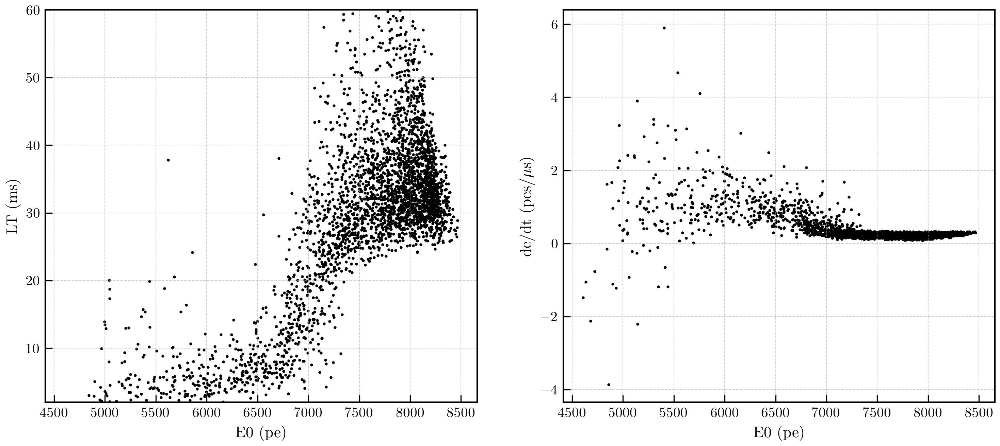

In [35]:
cv = pltext.canvas(2, 2)
cv(1)
ltvals = lt[krmap.success].ravel()
e0vals = krmap.eref[krmap.success].ravel()
plt.scatter(e0vals, ltvals/1e3, s = 1), plt.ylim((2., 60.)); 
plt.xlabel('E0 (pe)'); plt.ylabel(r'LT (ms)');

cv(2)
devals = krmap.dedt[krmap.success].ravel()
e0vals = krmap.eref[krmap.success].ravel()
plt.scatter(e0vals, devals, s = 1), 
plt.xlabel('E0 (pe)'); plt.ylabel(r'de/dt (pes/$\mu$s)');

## Kr correction

In [37]:
corr_energy = krtool.krmap_scale(coors, dtime, energy, krmap, scale = 41.5)
corr_energy = np.nan_to_num(corr_energy, nan=0.0)

In [38]:
def energy_resolution(energy, plot = False):
    xsel = ~np.isnan(energy)
    nbins, erange = 100, (38., 45)
    if (plot):
        pltext.hist(energy[xsel], nbins, erange);
    xfun = pltext.hfit if plot else histos.hfit
    cc = xfun(energy[xsel], nbins, range = erange, fun = 'gaus');
    pars = cc[3]
    sigma, mu = pars[2], pars[1]
    resolution = 235.5 * sigma/mu
    if (plot):
        print(' Resolution {:6.2f} % FWHM'.format(resolution))
    return resolution


In [39]:
cdf = pd.DataFrame({'x' : coors[0], 'y' : coors[1], 
                   'dtime' : dtime, 'energy' : energy, 'corr_energy': corr_energy})
cdf['r'] = np.sqrt(cdf.x**2 + cdf.y**2)

In [40]:
def eres_in_bins(eres, values, bins):
    dt0 = bins[0]
    ress = []
    for dt in bins[1:]:
        isel = ut.in_range(values, (dt0, dt))
        ires = energy_resolution(eres[isel]) 
        dt0 = dt
        ress.append(ires)
    return ress


In [41]:
eres_in_bins(cdf.corr_energy, cdf.dtime, (0, 1000, 1500))

[4.716920361662956, 4.920560737181998]

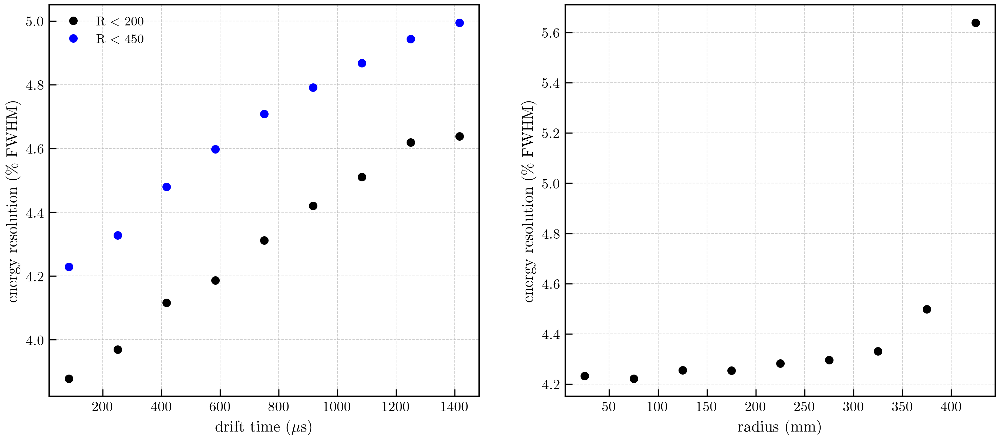

In [42]:
dtbins = np.linspace(0, 1500, 10)
ress = []
for rmax in (200, 450):
    usel = ut.in_range(cdf.r, (0, rmax))
    ires = eres_in_bins(cdf.corr_energy[usel], cdf.dtime[usel], dtbins)
    ress.append(ires)

rads = np.linspace(0, 450, 10)


cv = pltext.canvas(2, 2)
cv(1)
plt.plot(ut.centers(dtbins), ress[0], marker = 'o', linestyle = 'None', label = r"R $<$ 200");
plt.plot(ut.centers(dtbins), ress[1], marker = 'o', linestyle = 'None', label = r"R $<$ 450");
plt.legend(); plt.xlabel(r"drift time ($\mu$s)"); plt.ylabel("energy resolution (\% FWHM)");

rrs   = np.linspace(0, 450, 10)
ress2 = eres_in_bins(cdf.corr_energy, cdf.r, rrs)
cv(2)
plt.plot(ut.centers(rrs), ress2, marker = 'o', linestyle = 'None');
plt.xlabel(r"radius (mm)"); plt.ylabel("energy resolution (\% FWHM)");


AttributeError: 'DataFrame' object has no attribute 'r'

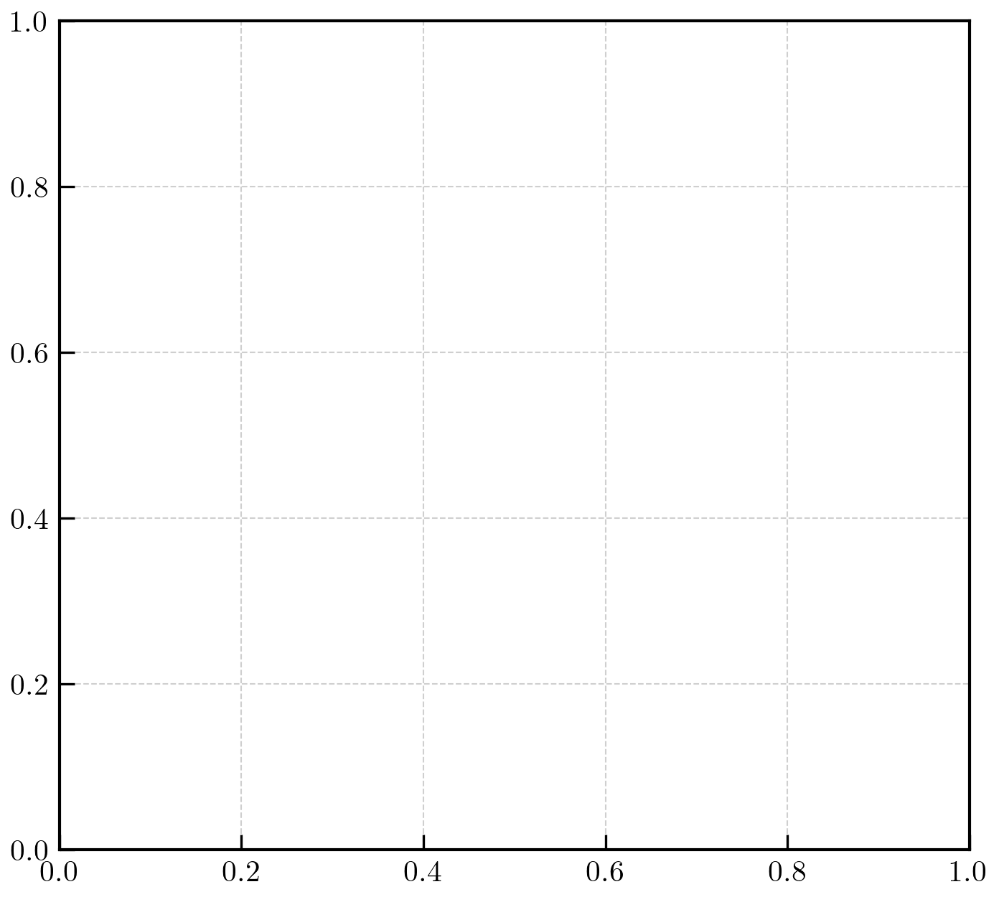

In [260]:
cv = pltext.canvas(2, 2)
cv(1)
usel = ut.in_range(df.r, (0, 100)) & ut.in_range(df.dtime, (0, 600))
#energy_resolution(df.corr_energy[usel], plot = True)
cv(2)
#energy_resolution(df.corr_energy, plot = True)

[1.96460331e+04 4.15271579e+01 8.29830861e-01]
 Resolution   4.71 % FWHM


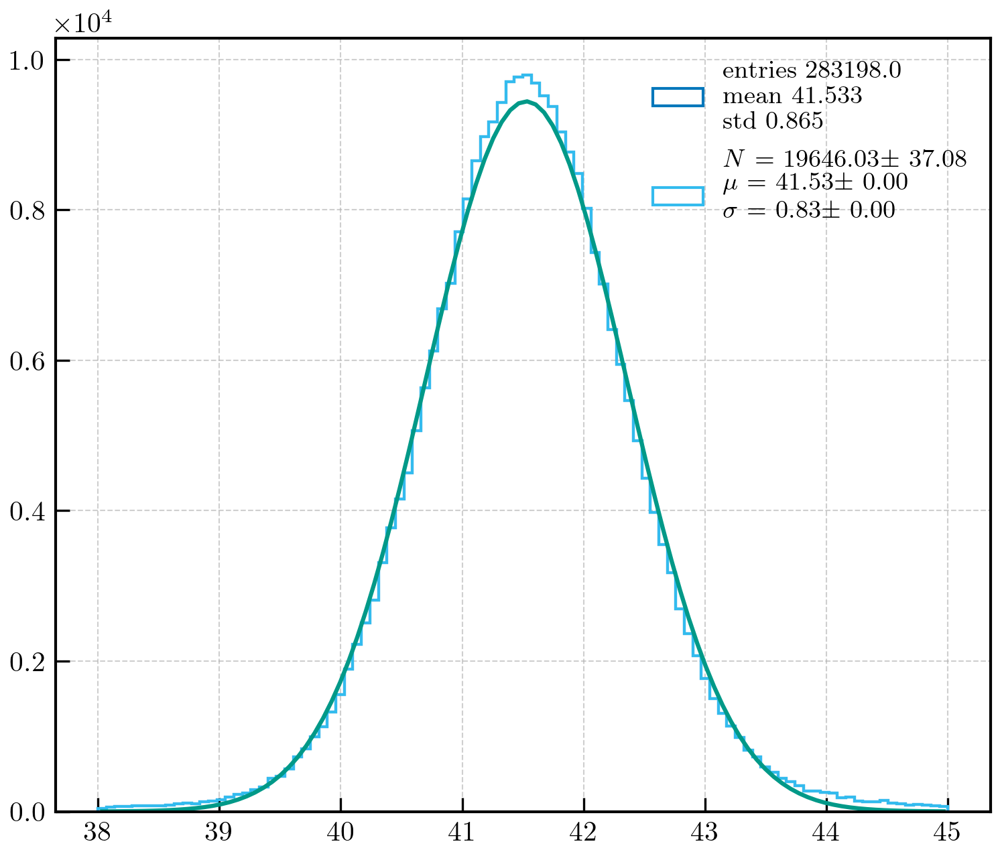

In [188]:
xsel = ~np.isnan(corr_energy)
nbins, erange = 100, (38., 45)
pltext.canvas(1, 1);
pltext.hist(corr_energy[xsel], nbins, erange);
cc = pltext.hfit(corr_energy[xsel], nbins, range = erange, fun = 'gaus');
pars = cc[3]
print(pars)
resolution = 235.5 * pars[2]/pars[1]
print(' Resolution {:6.2f} % FWHM'.format(resolution))

In [88]:
fwhm_factor = 2 * np.sqrt(2*np.log(2)) 
fwhm_factor * 0.83/(41.5)

0.047096400900618986

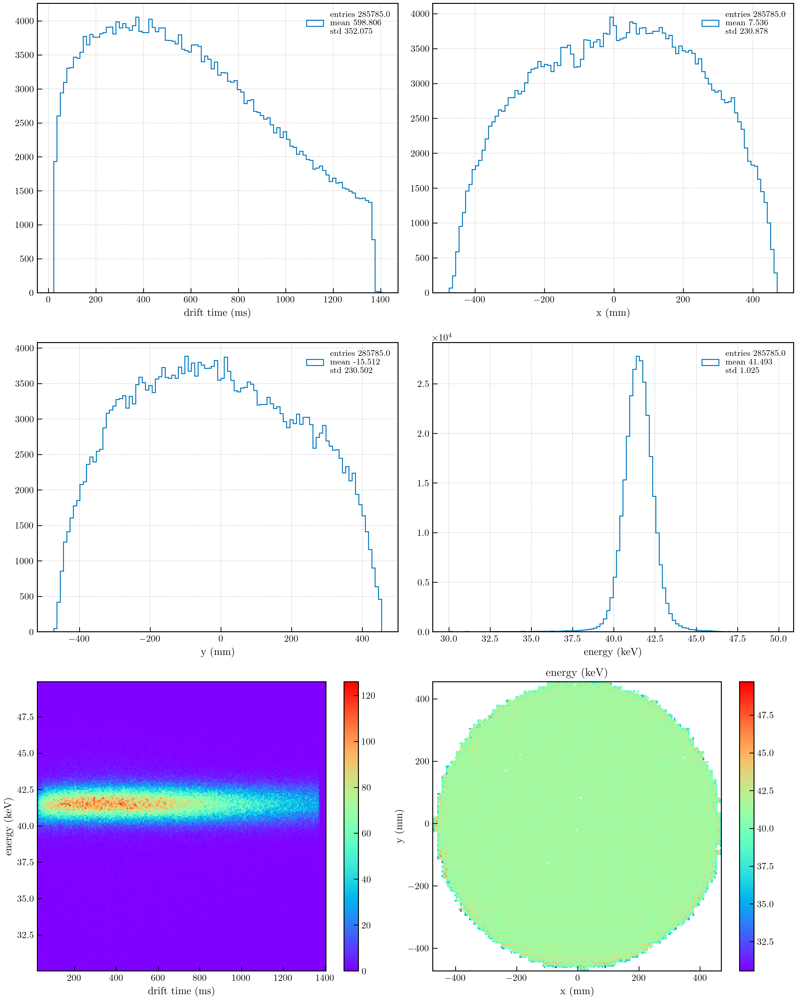

In [101]:
xsel = np.logical_and(~np.isnan(corr_energy), ut.in_range(corr_energy, (30, 50)))
df = {'x': coors[0][xsel], 'y' : coors[1][xsel], 'dtime': dtime[xsel], 'energy' : corr_energy[xsel]}
df = pd.DataFrame(df)
krana.plot_data(df.x, df.y, df.dtime, df.energy, bins = 200)

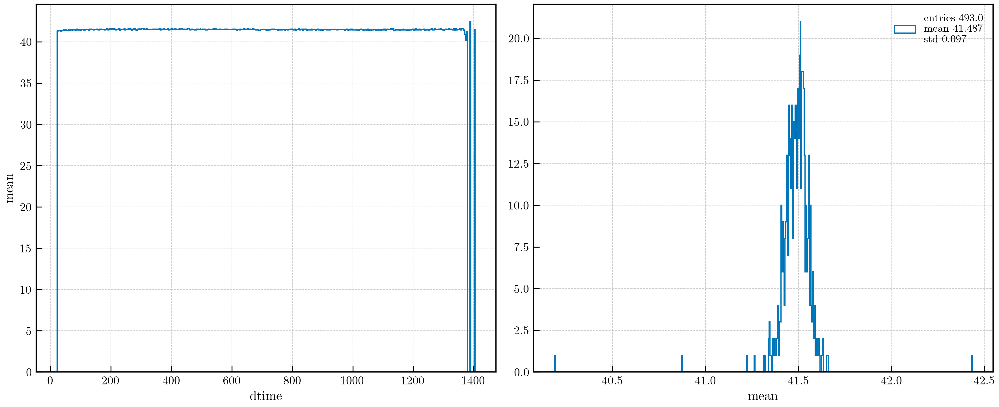

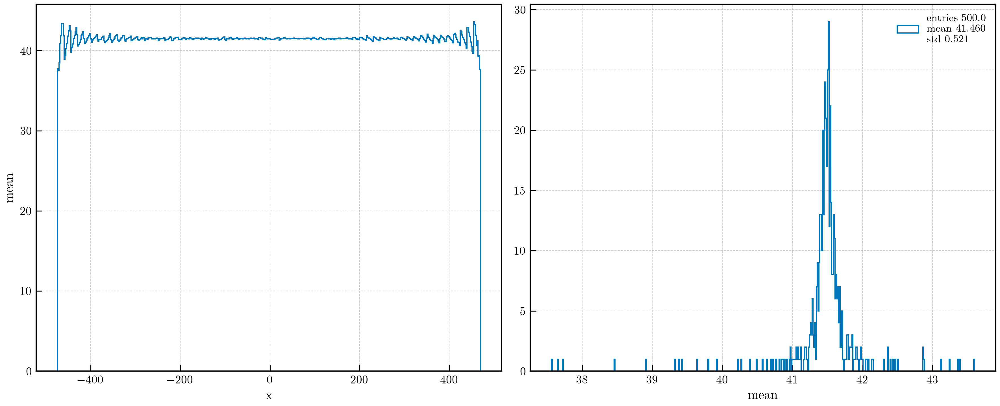

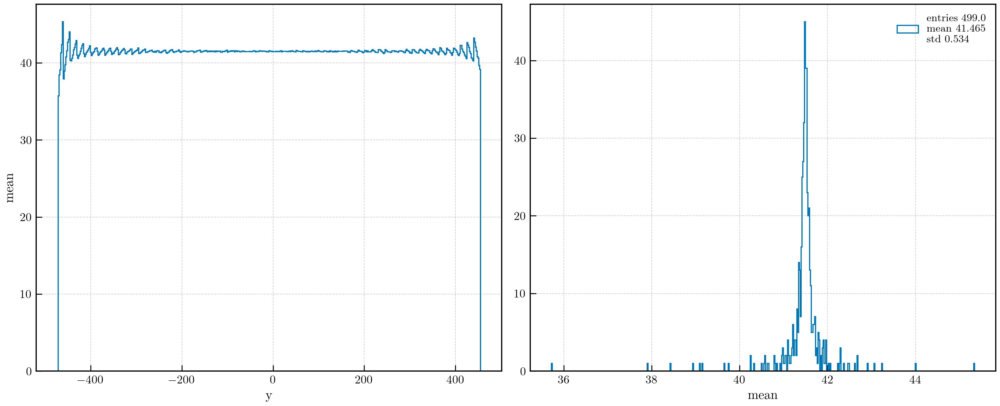

In [102]:
krtool.plot_xydt_energy_profiles(df, nbins = 500)

## Interpreting the S2

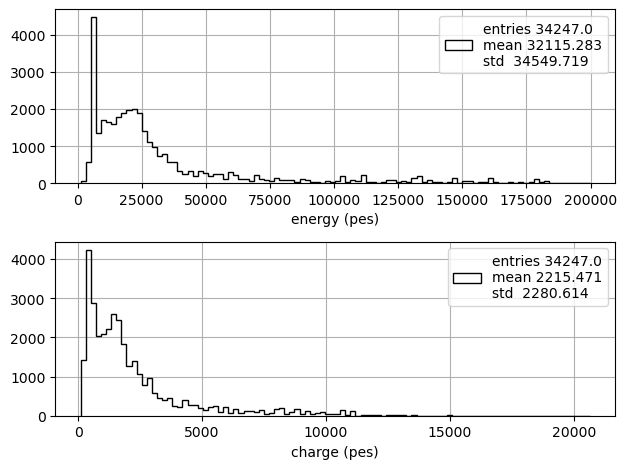

In [ ]:
sel = sels['fidutial']
plt.subplot(2, 1, 1)
pltext.hist(kdst[sel].energy, 100); plt.xlabel('energy (pes)')
plt.subplot(2, 1, 2)
pltext.hist(kdst[sel].S2q, 100); plt.xlabel('charge (pes)'); plt.tight_layout()

### Main distributions

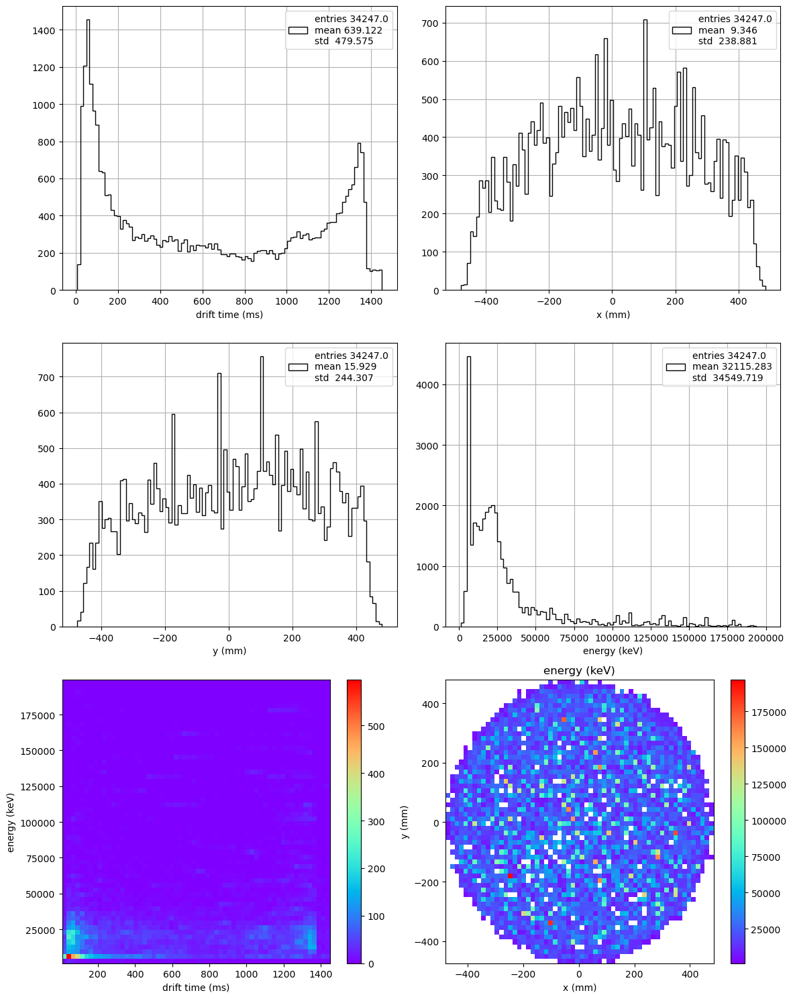

In [ ]:
sel = sels['fidutial']
krana.plot_data(mkdst[sel], 60)

In [ ]:
vdrift = np.max(mkdst[sel].z/mkdst[sel].dtime)
print('Drift velocity {:6.4f}'.format(vdrift))

Drift velocity 0.8700


## Kr map

In [ ]:
counts_min = 40
pitch      = 15.00
xmin       = -489.825
xbins      = np.arange(xmin, -xmin + pitch, pitch)
bins       = (xbins, xbins) 
print('number of bins ', len(xbins), ', range : ', xbins[0], ', ', xbins[-1])

number of bins  67 , range :  -489.825 ,  500.175


### clean map

In [ ]:
def clean_krmap(coors, dtime, energy, min_sigma = 0.9, dt0 = None, plot = True):
    sel     = np.ones(len(energy), bool)
    clean   = np.copy(sel)
    done    = False
    while (not done):
        icoors  = [coor[clean] for coor in coors]
        idtime  = dtime[clean]
        iene    = energy[clean]
        krmap, residuals   = krtool.krmap(icoors, idtime, iene,
                                         bins = bins, counts_min = counts_min, dt0 = dt0)
        done, usel = krtool.accept_residuals(residuals, range = (-5.,5.), 
                                            fun = 'gaus', nsigma = 4., min_sigma = min_sigma, plot = plot)
        clean[clean == True] = usel
    return krmap, clean

In [ ]:
sel    = sels['fidutial']
coors  = mkdst[sel].x, mkdst[sel].y
energy = mkdst[sel].energy
dtime  = mkdst[sel].dtime
counts_min = 60
bins   = (xbins, xbins) 

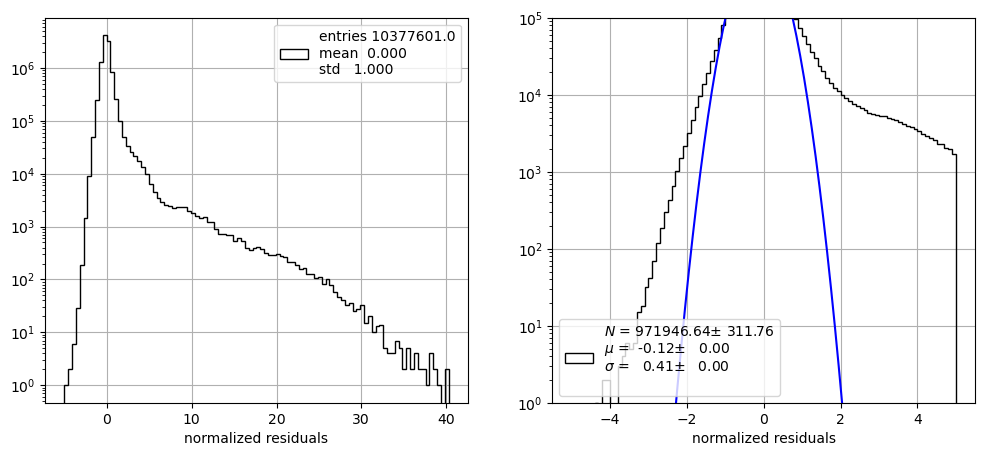

sigma 0.41 done  False  eff 97.43


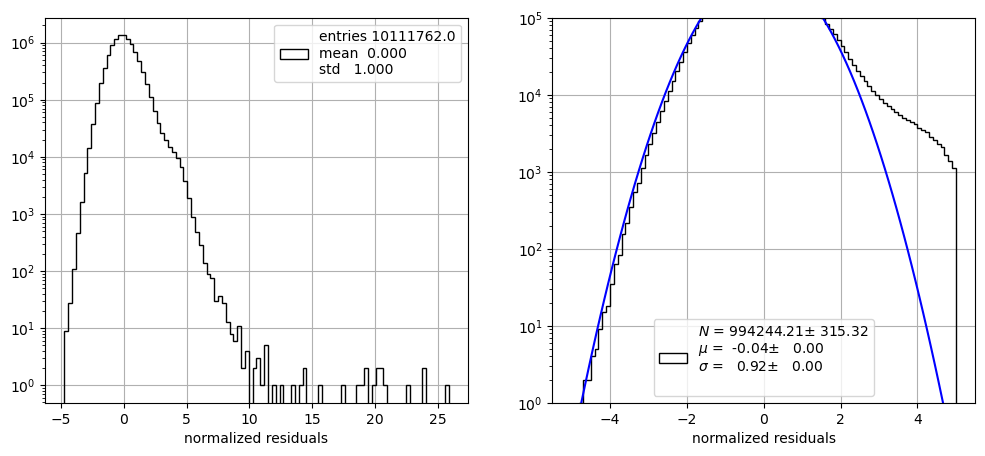

sigma 0.92 done  True  eff 100.00


In [ ]:
min_sigma = 0.92
krmap, usel = clean_krmap(coors, dtime, energy, min_sigma = min_sigma, dt0 = None)

In [ ]:
def krmap_set_lifetime(krmap):
    dedt, udedt = krmap.dedt, krmap.udedt
    eref, ueref = krmap.eref, krmap.ueref
    lt  = eref/dedt
    ult = np.sqrt((ueref/dedt)**2 + (lt * udedt/dedt)**2)
    return lt, ult


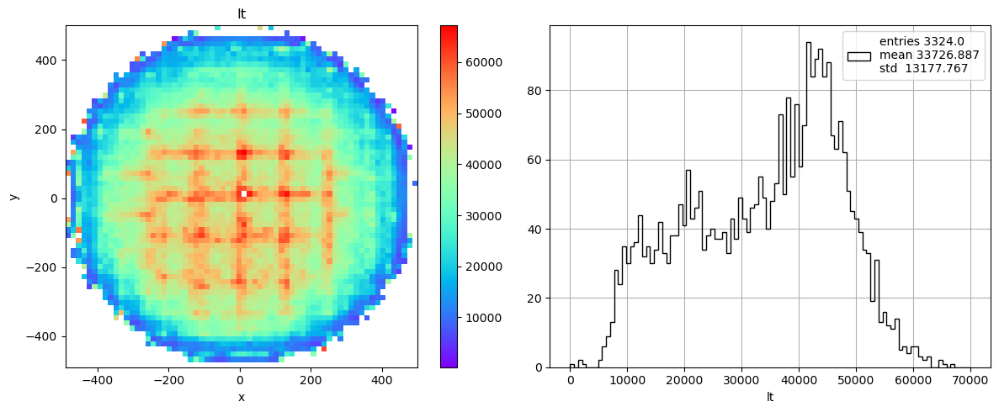

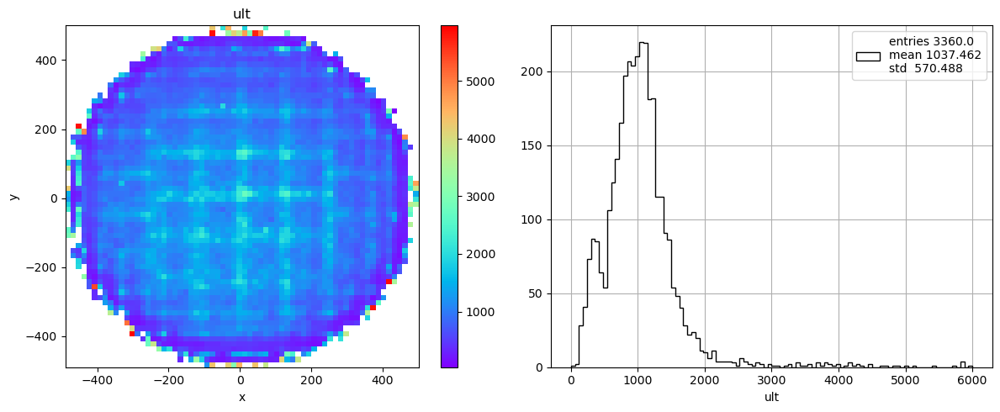

In [ ]:
lt, ult = krmap_set_lifetime(krmap)
krtool.plot_xyvar(lt   , krmap.bin_edges, 'lt'  , mask = krmap.success, range = (0, 7e4));
krtool.plot_xyvar(ult  , krmap.bin_edges, 'ult' , mask = krmap.success, range = (0, 6e3))


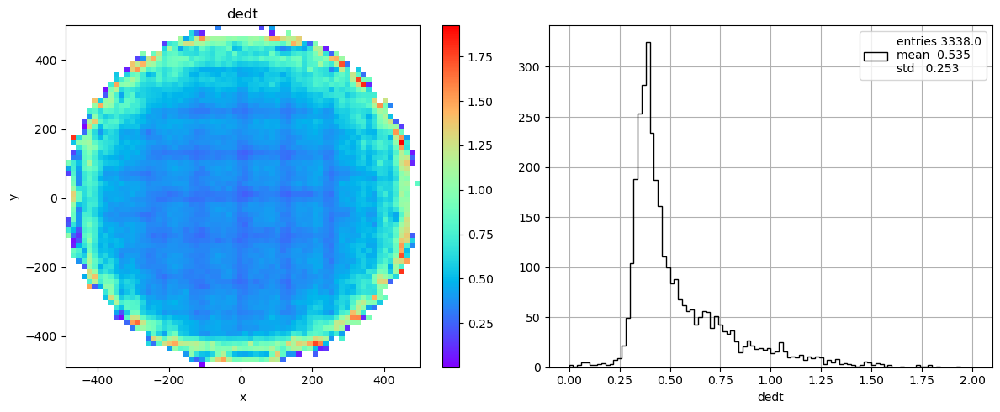

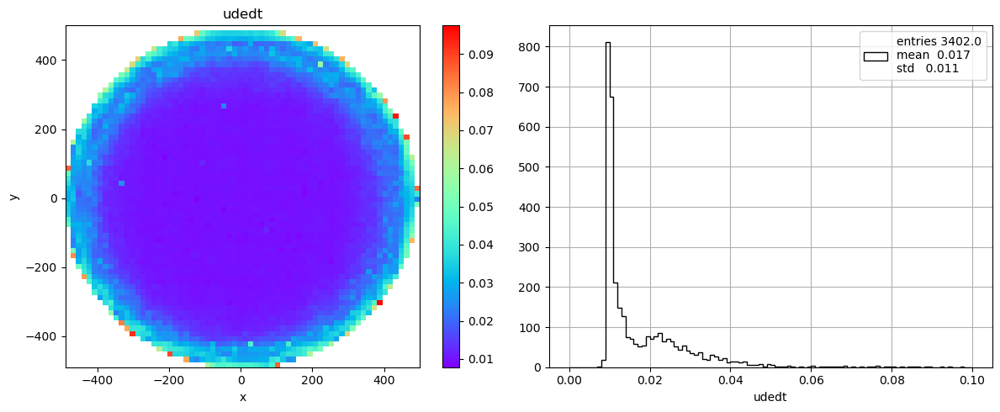

In [ ]:
lt, ult = krmap_set_lifetime(krmap)
krtool.plot_xyvar(krmap.dedt   , krmap.bin_edges, 'dedt'  , mask = krmap.success, range = (0, 2));
krtool.plot_xyvar(krmap.udedt  , krmap.bin_edges, 'udedt'  , mask = krmap.success, range = (0, 0.1))

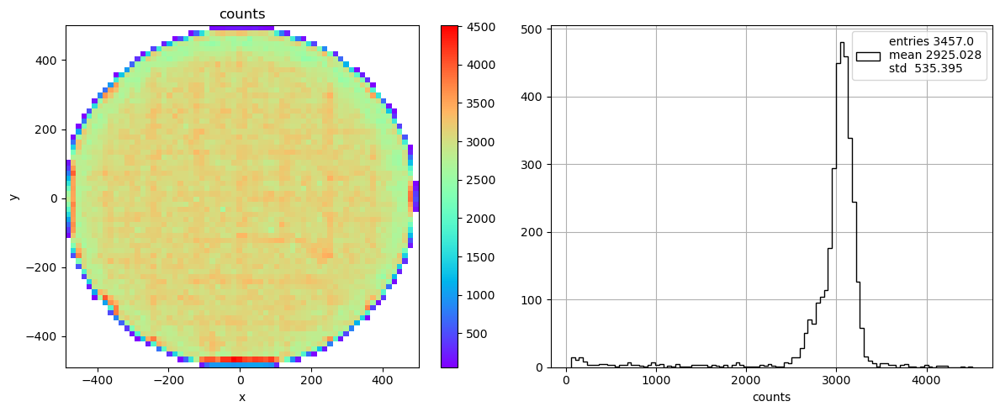

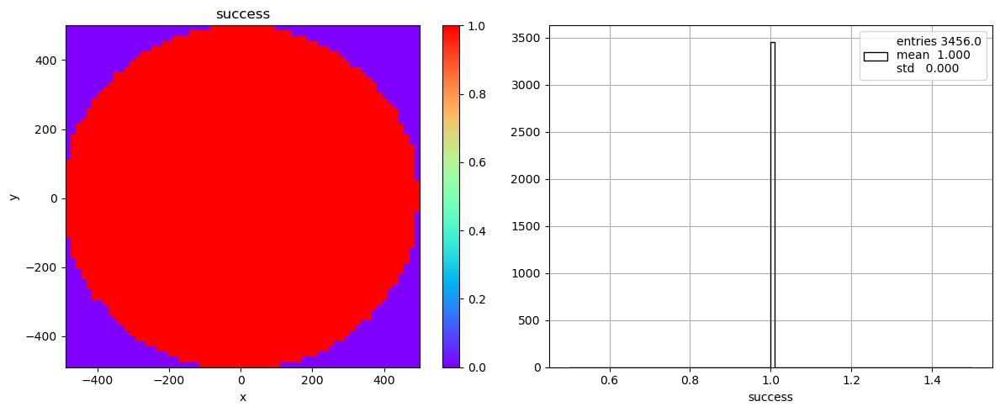

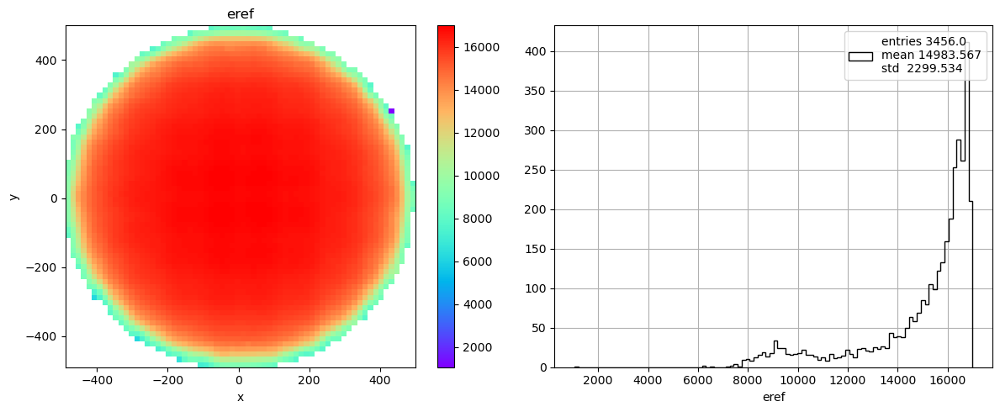

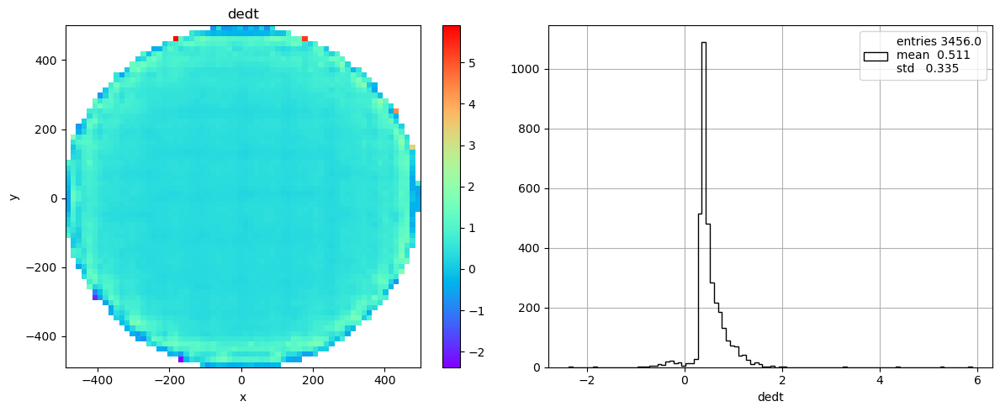

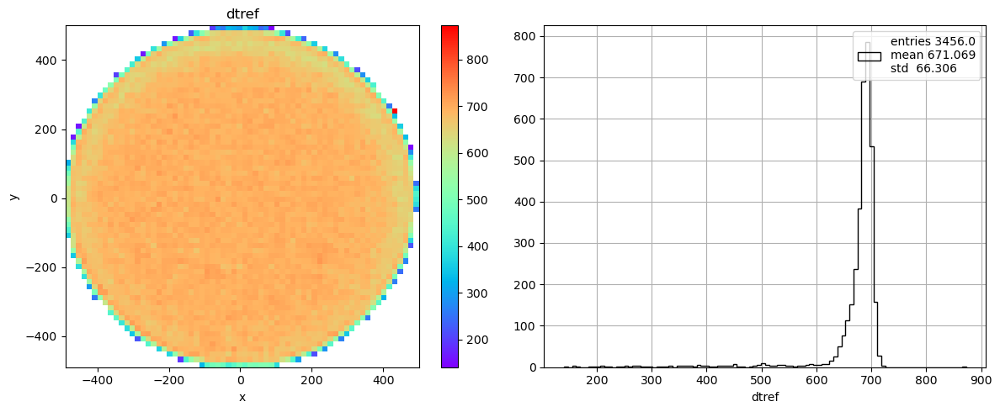

...

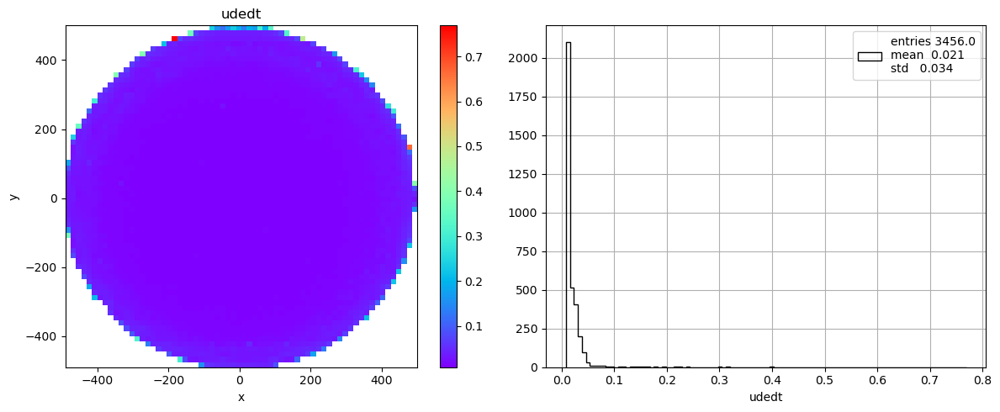

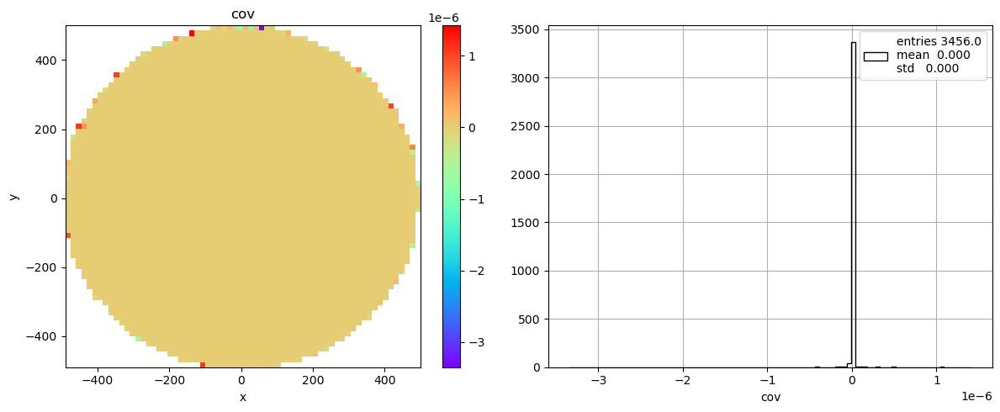

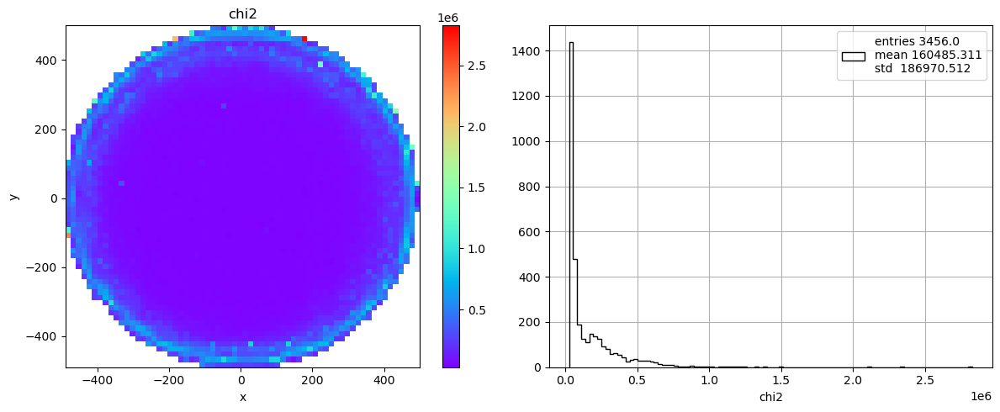

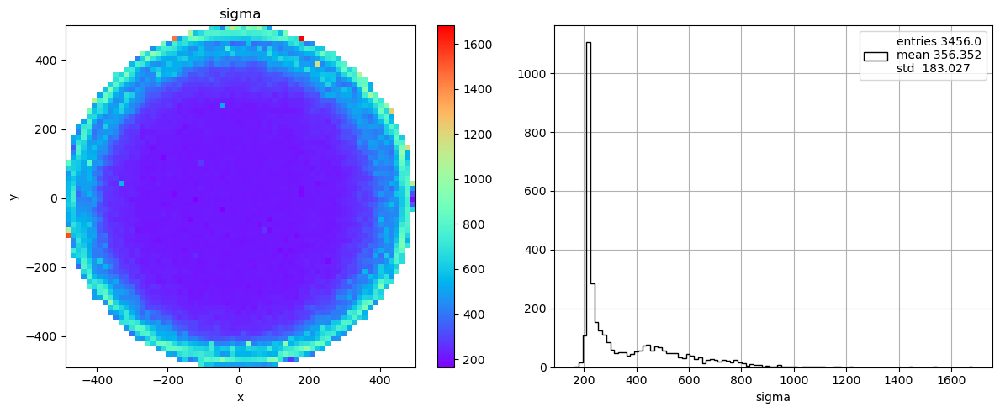

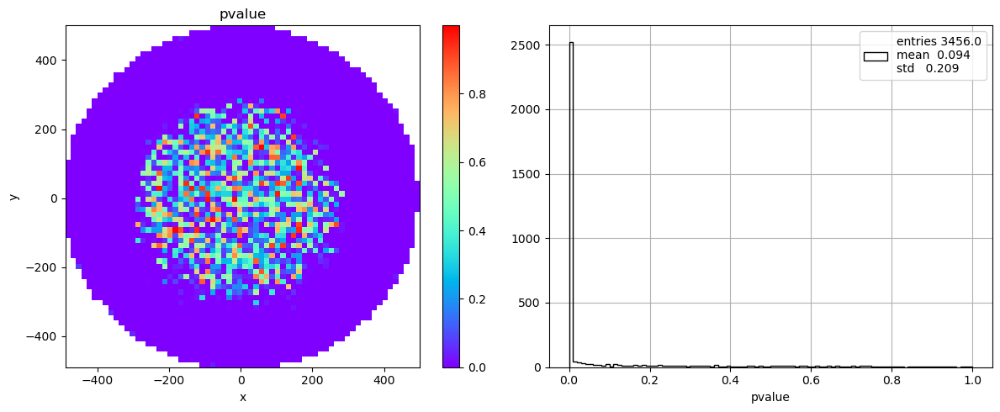

In [ ]:
krtool.plot_xyvar(krmap.counts , krmap.bin_edges, 'counts' , mask = krmap.counts > 0)
krtool.plot_xyvar(krmap.success, krmap.bin_edges, 'success', mask = krmap.success)
krtool.plot_xyvar(krmap.eref   , krmap.bin_edges, 'eref'   , mask = krmap.success)
krtool.plot_xyvar(krmap.dedt   , krmap.bin_edges, 'dedt'   , mask = krmap.success)
krtool.plot_xyvar(krmap.dtref  , krmap.bin_edges, 'dtref'  , mask = krmap.success)
krtool.plot_xyvar(krmap.ueref  , krmap.bin_edges, 'ueref'  , mask = krmap.success)
krtool.plot_xyvar(krmap.udedt  , krmap.bin_edges, 'udedt'  , mask = krmap.success)
krtool.plot_xyvar(krmap.cov    , krmap.bin_edges, 'cov'    , mask = krmap.success)
krtool.plot_xyvar(krmap.chi2   , krmap.bin_edges, 'chi2'   , mask = krmap.success)
krtool.plot_xyvar(krmap.sigma  , krmap.bin_edges, 'sigma'  , mask = krmap.success)
krtool.plot_xyvar(krmap.pvalue , krmap.bin_edges, 'pvalue' , mask = krmap.success)

## Correction

In [ ]:
corr_energy = krtool.krmap_scale(coors, dtime, energy, krmap, scale = 41.5)

 Resolution   3.95 % FWHM


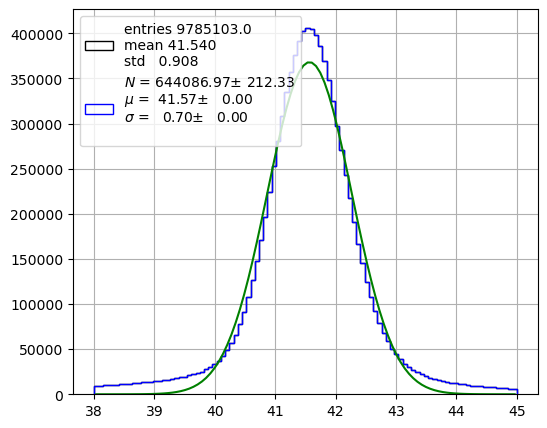

In [ ]:
xsel = ~np.isnan(corr_energy)
nbins, erange = 100, (38., 45)
pltext.canvas(1, 1);
pltext.hist(corr_energy[xsel], nbins, erange);
cc = pltext.hfit(corr_energy[xsel], nbins, range = erange, fun = 'gaus');
pars = cc[3]
resolution = 235.5 * pars[2]/pars[1]
print(' Resolution {:6.2f} % FWHM'.format(resolution))

In [ ]:
mu, umu = 41.57, 0.76
eres     = umu/mu * 235.
eres_qbb = eres * np.sqrt(0.041/2.458)
print('energy resolution FWHM Kr  :', eres)
print('emergy resolution FWHM Qbb :', eres_qbb)

energy resolution FWHM Kr  : 4.2963675727688235
emergy resolution FWHM Qbb : 0.5548842771963416


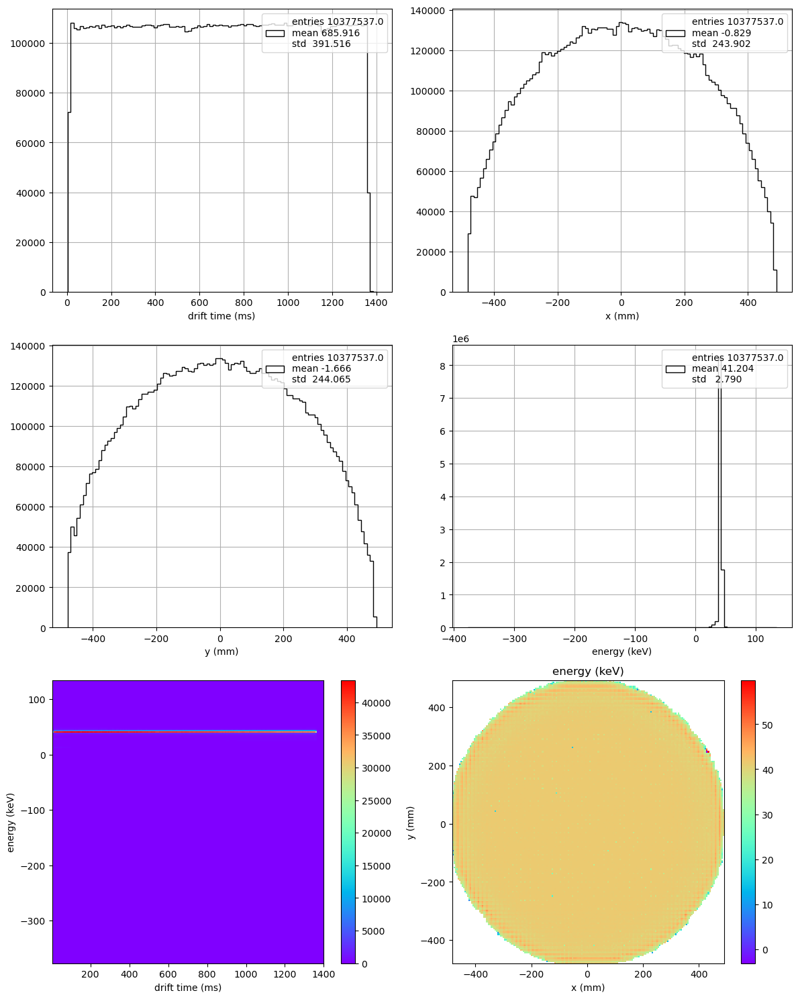

In [ ]:
xsel = ~np.isnan(corr_energy)
df = {'x': coors[0][xsel], 'y' : coors[1][xsel], 'dtime': dtime[xsel], 'energy' : corr_energy[xsel]}
df = pd.DataFrame(df)
krana.plot_data(df, bins = 200)
#plt.subplot(3, 2, 5)
#plt.ylim((25, 45));

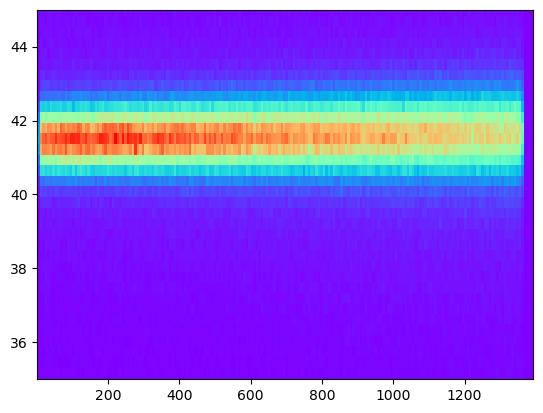

In [ ]:
plt.hist2d(df.dtime, df.energy, 200);
plt.ylim((35, 45));

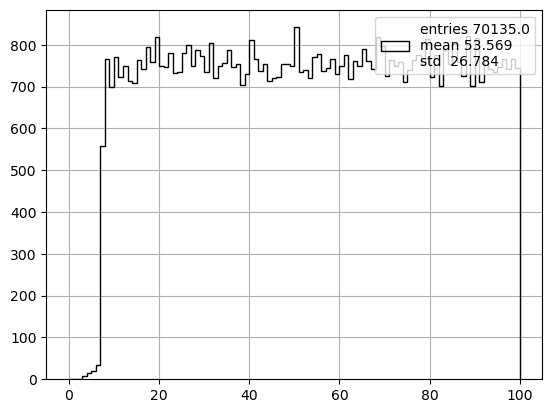

In [ ]:
plt.p

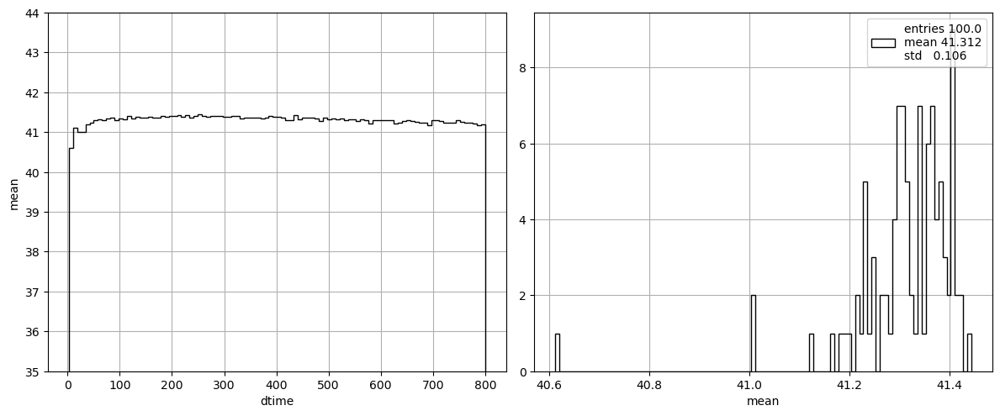

In [ ]:
sel = df.dtime < 800
zprof, _  = prof.profile((df.dtime[sel],), df.energy[sel], nbins)
prof.plot_profile(zprof, nbins = nbins, stats = ('mean',), coornames = ('dtime',))
plt.subplot(1, 2, 1);
plt.ylim((35, 44));

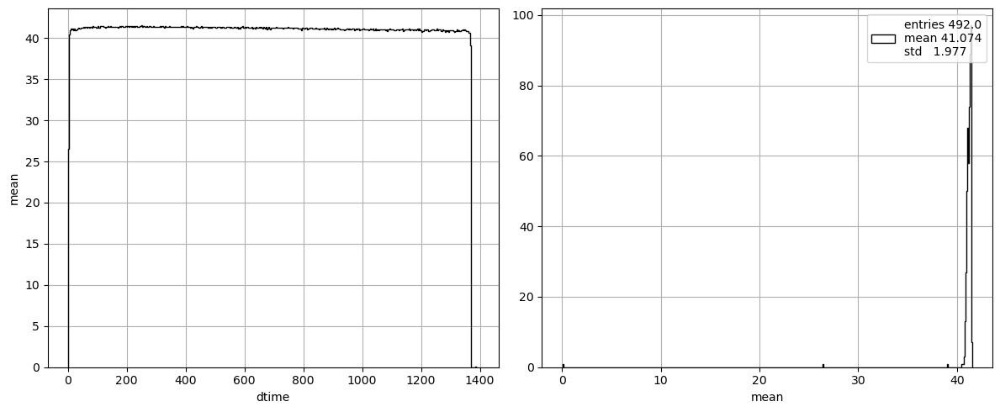

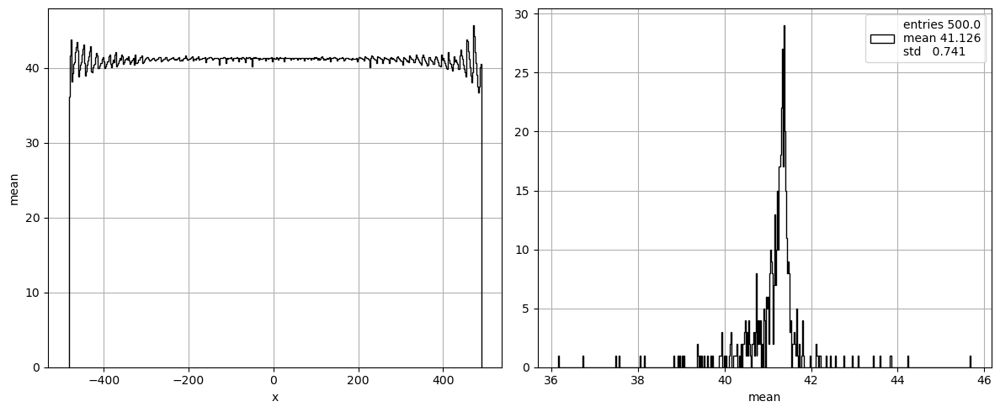

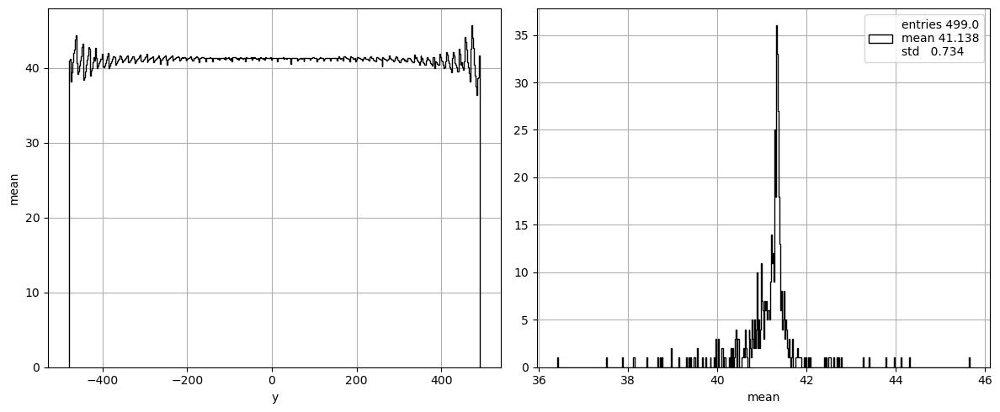

In [ ]:
krtool.plot_xydt_energy_profiles(df, nbins = 500)


## Charge